# 🛰️ Classification LULC Sentinel-2 — Richard Toll
## Pipeline Optimisé | Classes & Fonctions | Multi-Années (2015 & 2025) | RF & SVM Tuned
---
**Architecture :**
- `LULCConfig` — Configuration centralisée
- `SentinelLoader` — Chargement image + bandes
- `SpectralIndicesCalculator` — Calcul des 6 indices
- `TrainingDataExtractor` — Extraction des échantillons
- `LULCClassifier` — Entraînement, optimisation, prédiction
- `LULCVisualizer` — Toutes les visualisations
- `LULCPipeline` — Orchestrateur principal

In [1]:
# ╔══════════════════════════════════════════════════════════╗
# ║                     1. IMPORTS                          ║
# ╚══════════════════════════════════════════════════════════╝
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import warnings
import joblib
from pathlib import Path
from dataclasses import dataclass, field
from typing import Dict, List, Tuple, Optional

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, f1_score, cohen_kappa_score
)
from matplotlib.colors import ListedColormap, BoundaryNorm

warnings.filterwarnings('ignore')
%matplotlib inline
print("✓ Tous les imports chargés avec succès")

✓ Tous les imports chargés avec succès


In [2]:
# ╔══════════════════════════════════════════════════════════╗
# ║              2. CONFIGURATION CENTRALE                  ║
# ╚══════════════════════════════════════════════════════════╝

@dataclass
class LULCConfig:
    """Configuration centralisée pour les deux années."""
    
    # ── Chemins par année ──────────────────────────────────
    YEARS_CONFIG: Dict = field(default_factory=lambda: {
        2015: {
            "image": Path("/media/cardan/87E3-1616/Projet_SIG/sortie_2015/S2_2015_RichardToll_10bandes.tif"),
            "shapefile": Path("/home/cardan/Documents/Projet_sig_AS3/DB_2015/DB_2015.shp"),
            "output": Path("/media/cardan/87E3-1616/Projet_SIG/sortie_2015")
        },
        2025: {
            "image": Path("/media/cardan/87E3-1616/Projet_SIG/sortie_2025/sortie/S2_2025_RichardToll_10bandes.tif"),
            "shapefile": Path("/home/cardan/Documents/Projet_sig_AS3/DB_2025/DB_2025.shp"),
            "output": Path("/media/cardan/87E3-1616/Projet_SIG/sortie_2025")
        }
    })
    
    # ── Indices de bandes (dans le .tif 10 bandes) ─────────
    BAND_IDX: Dict = field(default_factory=lambda: {
        "B02": 2, "B03": 3, "B04": 4,
        "B05": 5, "B08": 8, "B11": 9
    })
    
    # ── Palette LULC professionnelle ────────────────────────
    # Couleurs cartographiques standard (inspirées IGN / FAO)
    LULC_COLORS: Dict = field(default_factory=lambda: {
        "Eau":          "#2166AC",   # Bleu profond
        "Bâti":         "#D73027",   # Rouge brique
        "Sols cultivés":"#FEC44F",   # Jaune or
        "Jachère":      "#4DAF4A",   # Vert herbe
        "Sols nus":     "#D9B382",   # Beige sable
        "Zones humides":"#74C476"    # Vert d'eau
    })
    
    # ── Paramètres ML ──────────────────────────────────────
    TEST_SIZE: float = 0.3
    RANDOM_STATE: int = 42
    BLOCK_SIZE: int = 2000       # pixels par bloc pour prédiction
    CV_FOLDS: int = 5            # folds pour cross-validation
    
    def __post_init__(self):
        self.LULC_CLASSES = sorted(self.LULC_COLORS.keys())
        self.LULC_MAPPING = {cls: i for i, cls in enumerate(self.LULC_CLASSES)}
        self.LULC_CMAP = ListedColormap([self.LULC_COLORS[c] for c in self.LULC_CLASSES])
        self.LULC_RIO_CMAP = {
            i: self._hex_to_rgba(self.LULC_COLORS[c])
            for i, c in enumerate(self.LULC_CLASSES)
        }
        print(f"✓ Config initialisée — {len(self.LULC_CLASSES)} classes LULC")
        print(f"  Classes : {self.LULC_CLASSES}")
    
    @staticmethod
    def _hex_to_rgba(h: str) -> Tuple:
        h = h.lstrip("#")
        return tuple(int(h[i:i+2], 16) for i in (0, 2, 4)) + (255,)
    
    def get_year_paths(self, year: int) -> Dict:
        if year not in self.YEARS_CONFIG:
            raise ValueError(f"Année {year} non configurée. Disponibles : {list(self.YEARS_CONFIG.keys())}")
        cfg = self.YEARS_CONFIG[year]
        cfg["output"].mkdir(parents=True, exist_ok=True)
        return cfg


# Instanciation globale
CFG = LULCConfig()

✓ Config initialisée — 6 classes LULC
  Classes : ['Bâti', 'Eau', 'Jachère', 'Sols cultivés', 'Sols nus', 'Zones humides']


In [3]:
# ╔══════════════════════════════════════════════════════════╗
# ║           3. CLASSE : CHARGEMENT DE L'IMAGE             ║
# ╚══════════════════════════════════════════════════════════╝

class SentinelLoader:
    """Charge et gère les bandes Sentinel-2."""
    
    def __init__(self, img_path: Path, band_idx: Dict):
        self.img_path = img_path
        self.band_idx = band_idx
        self.bands: Dict[str, np.ndarray] = {}
        self.profile = None
        self.transform = None
        self.shape = None
    
    def load(self) -> 'SentinelLoader':
        """Charge toutes les bandes depuis le fichier .tif."""
        print(f"🛰️  Chargement : {self.img_path.name}")
        with rasterio.open(self.img_path) as src:
            print(f"   CRS : {src.crs}  |  Taille : {src.width}×{src.height}  |  Bandes : {src.count}")
            self.profile = src.profile
            self.transform = src.transform
            self.shape = (src.height, src.width)
            nd = src.nodata
            
            for name, idx in self.band_idx.items():
                arr = src.read(idx).astype("float32")
                if nd is not None:
                    arr[arr == nd] = np.nan
                self.bands[name] = arr
        
        print(f"   ✓ {len(self.bands)} bandes chargées : {list(self.bands.keys())}")
        return self
    
    @staticmethod
    def normalize(arr: np.ndarray, p_low: float = 2, p_high: float = 98) -> np.ndarray:
        """Normalisation percentile pour visualisation."""
        p2, p98 = np.nanpercentile(arr, (p_low, p_high))
        return np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)
    
    def make_rgb(self) -> np.ndarray:
        """Composite RGB naturel (B04-B03-B02)."""
        return np.stack([
            self.normalize(self.bands["B04"]),
            self.normalize(self.bands["B03"]),
            self.normalize(self.bands["B02"])
        ], axis=2)
    
    def make_false_color(self) -> np.ndarray:
        """Fausse couleur NIR (B08-B04-B03)."""
        return np.stack([
            self.normalize(self.bands["B08"]),
            self.normalize(self.bands["B04"]),
            self.normalize(self.bands["B03"])
        ], axis=2)

In [4]:
# ╔══════════════════════════════════════════════════════════╗
# ║        4. CLASSE : INDICES SPECTRAUX                    ║
# ╚══════════════════════════════════════════════════════════╝

class SpectralIndicesCalculator:
    """Calcule et sauvegarde les 6 indices spectraux."""
    
    DEFINITIONS = [
        ("NDVI",  "RdYlGn",  "Végétation (NDVI)"),
        ("SAVI",  "RdYlGn",  "Végétation ajustée sol (SAVI)"),
        ("NDWI",  "YlGnBu",  "Eau — McFeeters (NDWI)"),
        ("MNDWI", "YlGnBu",  "Eau SWIR modifié (MNDWI)"),
        ("BSI",   "YlOrBr",  "Sols nus (BSI)"),
        ("NDRE",  "Greens",  "Red Edge (NDRE)")
    ]
    
    def __init__(self, loader: SentinelLoader):
        self.loader = loader
        self.indices: Dict[str, np.ndarray] = {}
        b = loader.bands
        self._b = b  # raccourci
    
    def compute_all(self) -> 'SpectralIndicesCalculator':
        """Calcule les 6 indices spectraux."""
        b = self._b
        print("🧮 Calcul des indices spectraux...")
        
        with np.errstate(divide="ignore", invalid="ignore"):
            self.indices["NDVI"]  = np.clip((b["B08"] - b["B04"]) / (b["B08"] + b["B04"] + 1e-6), -1, 1)
            self.indices["SAVI"]  = np.clip(((b["B08"] - b["B04"]) / (b["B08"] + b["B04"] + 0.5)) * 1.5, -1, 1)
            self.indices["NDWI"]  = np.clip((b["B03"] - b["B08"]) / (b["B03"] + b["B08"] + 1e-6), -1, 1)
            self.indices["MNDWI"] = np.clip((b["B03"] - b["B11"]) / (b["B03"] + b["B11"] + 1e-6), -1, 1)
            self.indices["BSI"]   = np.clip(
                ((b["B11"] + b["B04"]) - (b["B08"] + b["B02"])) /
                ((b["B11"] + b["B04"]) + (b["B08"] + b["B02"]) + 1e-6), -1, 1
            )
            self.indices["NDRE"]  = np.clip((b["B08"] - b["B05"]) / (b["B08"] + b["B05"] + 1e-6), -1, 1)
        
        print(f"   ✓ {len(self.indices)} indices calculés : {list(self.indices.keys())}")
        return self
    
    def save_all(self, out_dir: Path, year: int, profile: dict) -> None:
        """Sauvegarde chaque indice comme GeoTiff."""
        p = profile.copy()
        p.update(count=1, dtype=rasterio.float32, nodata=np.nan)
        for name, arr in self.indices.items():
            path = str(out_dir / f"{name}_{year}.tif")
            with rasterio.open(path, "w", **p) as dst:
                dst.write(arr, 1)
        print(f"   ✓ {len(self.indices)} indices sauvegardés dans {out_dir}")
    
    @property
    def feature_arrays(self) -> List[np.ndarray]:
        """Liste ordonnée des indices pour construction des features."""
        return [self.indices[k] for k in ["NDVI", "SAVI", "NDWI", "MNDWI", "BSI", "NDRE"]]

In [5]:
# ╔══════════════════════════════════════════════════════════╗
# ║       5. CLASSE : EXTRACTION DES DONNÉES               ║
# ╚══════════════════════════════════════════════════════════╝

class TrainingDataExtractor:
    """Extrait les valeurs spectrales aux points d'entraînement."""
    
    def __init__(self, img_path: Path, loader: SentinelLoader,
                 indices_calc: SpectralIndicesCalculator):
        self.img_path = img_path
        self.loader = loader
        self.indices_calc = indices_calc
        
        # Feature names dans l'ordre
        self.feat_names = ["B02", "B03", "B04", "B05", "B08", "B11",
                           "NDVI", "SAVI", "NDWI", "MNDWI", "BSI", "NDRE"]
        self._all_bands: List[np.ndarray] = []
    
    def _build_band_list(self) -> List[np.ndarray]:
        """Construit la liste ordonnée des arrays bandes + indices."""
        b = self.loader.bands
        idx = self.indices_calc.indices
        return [
            b["B02"], b["B03"], b["B04"], b["B05"], b["B08"], b["B11"],
            idx["NDVI"], idx["SAVI"], idx["NDWI"], idx["MNDWI"], idx["BSI"], idx["NDRE"]
        ]
    
    def extract(self, shp_path: Path, class_col: str = "classe") -> Tuple[np.ndarray, np.ndarray]:
        """Extrait X, y depuis le shapefile d'entraînement."""
        print(f"📂 Chargement shapefile : {shp_path.name}")
        gdf = gpd.read_file(str(shp_path))
        gdf = gdf[gdf.geometry.notnull()].reset_index(drop=True)
        
        if class_col not in gdf.columns:
            raise ValueError(f"Colonne '{class_col}' absente. Colonnes dispo : {list(gdf.columns)}")
        
        print(f"   Points totaux : {len(gdf)}")
        print(f"   Classes : {sorted(gdf[class_col].unique())}")
        
        # Distribution
        dist = gdf[class_col].value_counts()
        print("   Distribution :")
        for cls, cnt in dist.items():
            print(f"     {cls}: {cnt} pts ({cnt/len(gdf)*100:.1f}%)")
        
        self._all_bands = self._build_band_list()
        X_list, y_list = [], []
        
        with rasterio.open(self.img_path) as ds:
            for _, row in gdf.iterrows():
                geom = row.geometry
                p = geom if geom.geom_type == "Point" else geom.centroid
                try:
                    r, c = ds.index(p.x, p.y)
                    v = [b[r, c] for b in self._all_bands]
                    if not np.isnan(v).any():
                        X_list.append(v)
                        y_list.append(row[class_col])
                except Exception:
                    continue
        
        X = np.array(X_list)
        y = np.array(y_list)
        n_skip = len(gdf) - len(X)
        print(f"   ✓ {len(X)} échantillons extraits ({n_skip} ignorés — hors image ou NoData)")
        
        self._all_bands_ref = self._all_bands  # garder pour prédiction image complète
        return X, y

In [6]:
# ╔══════════════════════════════════════════════════════════╗
# ║          6. CLASSE : CLASSIFICATION LULC                ║
# ╚══════════════════════════════════════════════════════════╝

class LULCClassifier:
    """
    Entraîne, optimise (GridSearchCV) et compare RF vs SVM vs GBM.
    Sélectionne automatiquement le meilleur modèle.
    """
    
    # Grilles de recherche d'hyperparamètres
    RF_PARAM_GRID = {
        "n_estimators": [200, 400],
        "max_depth": [None, 20, 40],
        "min_samples_leaf": [1, 2],
        "max_features": ["sqrt", "log2"]
    }
    
    SVM_PARAM_GRID = {
        "C": [1, 10, 100],
        "gamma": ["scale", "auto"],
        "kernel": ["rbf"]
    }
    
    def __init__(self, cfg: LULCConfig, feat_names: List[str], optimize: bool = True):
        self.cfg = cfg
        self.feat_names = feat_names
        self.optimize = optimize  # True = GridSearchCV, False = params défaut rapides
        self.scaler = StandardScaler()
        self.results: Dict[str, dict] = {}
        self.best_name: str = None
        self.best_model = None
        self.best_scaler = None
    
    def prepare_data(self, X: np.ndarray, y: np.ndarray):
        """Split stratifié + normalisation."""
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            X, y,
            test_size=self.cfg.TEST_SIZE,
            stratify=y,
            random_state=self.cfg.RANDOM_STATE
        )
        self.X_train_s = self.scaler.fit_transform(self.X_train)
        self.X_test_s  = self.scaler.transform(self.X_test)
        print(f"✓ Données préparées — Train: {len(self.X_train)} | Test: {len(self.X_test)}")
        return self
    
    def _train_rf(self) -> Tuple:
        """Entraîne Random Forest avec ou sans optimisation."""
        print("\n🌲 Random Forest...")
        cv = StratifiedKFold(n_splits=self.cfg.CV_FOLDS, shuffle=True,
                             random_state=self.cfg.RANDOM_STATE)
        
        base_rf = RandomForestClassifier(n_jobs=-1, random_state=self.cfg.RANDOM_STATE)
        
        if self.optimize:
            print("   🔍 GridSearchCV en cours...")
            gs = GridSearchCV(base_rf, self.RF_PARAM_GRID, cv=cv,
                              scoring="accuracy", n_jobs=-1, verbose=0)
            gs.fit(self.X_train_s, self.y_train)
            model = gs.best_estimator_
            print(f"   Best params : {gs.best_params_}")
        else:
            model = RandomForestClassifier(
                n_estimators=300, max_depth=None, min_samples_leaf=2,
                n_jobs=-1, random_state=self.cfg.RANDOM_STATE
            )
            model.fit(self.X_train_s, self.y_train)
        
        y_pred = model.predict(self.X_test_s)
        acc    = accuracy_score(self.y_test, y_pred)
        f1     = f1_score(self.y_test, y_pred, average="weighted")
        kappa  = cohen_kappa_score(self.y_test, y_pred)
        print(f"   ✓ Acc: {acc:.2%}  F1: {f1:.3f}  Kappa: {kappa:.3f}")
        return model, y_pred, acc, f1, kappa
    
    def _train_svm(self) -> Tuple:
        """Entraîne SVM avec ou sans optimisation."""
        print("\n🤖 SVM...")
        cv = StratifiedKFold(n_splits=self.cfg.CV_FOLDS, shuffle=True,
                             random_state=self.cfg.RANDOM_STATE)
        
        base_svm = SVC(random_state=self.cfg.RANDOM_STATE, probability=True)
        
        if self.optimize:
            print("   🔍 GridSearchCV en cours...")
            gs = GridSearchCV(base_svm, self.SVM_PARAM_GRID, cv=cv,
                              scoring="accuracy", n_jobs=-1, verbose=0)
            gs.fit(self.X_train_s, self.y_train)
            model = gs.best_estimator_
            print(f"   Best params : {gs.best_params_}")
        else:
            model = SVC(kernel="rbf", C=10, gamma="scale",
                        random_state=self.cfg.RANDOM_STATE)
            model.fit(self.X_train_s, self.y_train)
        
        y_pred = model.predict(self.X_test_s)
        acc    = accuracy_score(self.y_test, y_pred)
        f1     = f1_score(self.y_test, y_pred, average="weighted")
        kappa  = cohen_kappa_score(self.y_test, y_pred)
        print(f"   ✓ Acc: {acc:.2%}  F1: {f1:.3f}  Kappa: {kappa:.3f}")
        return model, y_pred, acc, f1, kappa
    
    def train_all(self) -> 'LULCClassifier':
        """Entraîne tous les modèles et sélectionne le meilleur."""
        print("\n" + "="*55)
        print("🚀 ENTRAÎNEMENT DES MODÈLES")
        print("="*55)
        
        rf_res  = self._train_rf()
        svm_res = self._train_svm()
        
        self.results = {
            "Random Forest": {
                "model": rf_res[0],  "y_pred": rf_res[1],
                "acc": rf_res[2],    "f1": rf_res[3],  "kappa": rf_res[4]
            },
            "SVM": {
                "model": svm_res[0], "y_pred": svm_res[1],
                "acc": svm_res[2],   "f1": svm_res[3], "kappa": svm_res[4]
            }
        }
        
        # Sélection par F1 pondéré (plus robuste que l'accuracy seule)
        self.best_name = max(self.results, key=lambda k: self.results[k]["f1"])
        self.best_model  = self.results[self.best_name]["model"]
        self.best_scaler = self.scaler
        
        print(f"\n🏆 MEILLEUR MODÈLE : {self.best_name}")
        print(f"   Acc: {self.results[self.best_name]['acc']:.2%}")
        print(f"   F1 : {self.results[self.best_name]['f1']:.3f}")
        print(f"   κ  : {self.results[self.best_name]['kappa']:.3f}")
        return self
    
    def predict_image(self, all_bands: List[np.ndarray]) -> np.ndarray:
        """Applique le meilleur modèle à l'image complète par blocs."""
        h, w = all_bands[0].shape
        class_map = np.full((h, w), 255, dtype=np.uint8)
        BLOCK = self.cfg.BLOCK_SIZE
        print(f"\n🗺️  Classification image complète ({h}×{w} px, blocs de {BLOCK})...")
        
        for y_s in range(0, h, BLOCK):
            y_e = min(y_s + BLOCK, h)
            for x_s in range(0, w, BLOCK):
                x_e = min(x_s + BLOCK, w)
                blk = np.stack(
                    [b[y_s:y_e, x_s:x_e].flatten() for b in all_bands],
                    axis=1
                )
                m = ~np.isnan(blk).any(axis=1)
                if m.any():
                    scaled = self.best_scaler.transform(blk[m])
                    preds  = self.best_model.predict(scaled)
                    p_int  = np.array(
                        [self.cfg.LULC_MAPPING.get(c, 255) for c in preds],
                        dtype=np.uint8
                    )
                    res = np.full(blk.shape[0], 255, dtype=np.uint8)
                    res[m] = p_int
                    class_map[y_s:y_e, x_s:x_e] = res.reshape((y_e - y_s, x_e - x_s))
        
        print("   ✓ Classification terminée")
        return class_map
    
    def save_model(self, out_dir: Path, year: int) -> None:
        """Sauvegarde le meilleur modèle + scaler."""
        joblib.dump(self.best_model,  out_dir / f"model_{year}.pkl")
        joblib.dump(self.best_scaler, out_dir / f"scaler_{year}.pkl")
        print(f"   ✓ Modèle sauvegardé : model_{year}.pkl")

In [7]:
# ╔══════════════════════════════════════════════════════════╗
# ║           7. CLASSE : VISUALISATION                     ║
# ╚══════════════════════════════════════════════════════════╝

class LULCVisualizer:
    """Toutes les visualisations du pipeline LULC."""
    
    # Thème global
    BG   = "#0F1117"   # fond sombre
    GRID = "#2A2D3E"   # grilles
    TXT  = "#E8E8F0"   # texte
    
    def __init__(self, cfg: LULCConfig, out_dir: Path, year: int):
        self.cfg = cfg
        self.out_dir = out_dir
        self.year = year
        self._setup_theme()
    
    def _setup_theme(self):
        plt.rcParams.update({
            "figure.facecolor":  self.BG,
            "axes.facecolor":    self.BG,
            "axes.edgecolor":    self.GRID,
            "axes.labelcolor":   self.TXT,
            "xtick.color":       self.TXT,
            "ytick.color":       self.TXT,
            "text.color":        self.TXT,
            "font.family":       "DejaVu Sans",
            "axes.titlesize":    13,
            "axes.titleweight":  "bold"
        })
    
    def _save(self, fname: str):
        path = str(self.out_dir / fname)
        plt.savefig(path, dpi=150, bbox_inches="tight", facecolor=self.BG)
        plt.show()
        print(f"   💾 Sauvegardé : {fname}")
    
    def plot_composites(self, loader: SentinelLoader) -> None:
        """Affiche les composites RGB et fausse couleur."""
        fig, axes = plt.subplots(1, 2, figsize=(18, 8), facecolor=self.BG)
        
        rgb = loader.make_rgb()
        fc  = loader.make_false_color()
        
        for ax, img, title in zip(axes,
            [rgb, fc],
            [f"Composite RGB — {self.year}", f"Fausse Couleur NIR — {self.year}"]):
            ax.imshow(img)
            ax.set_title(title, color=self.TXT)
            ax.axis("off")
        
        plt.tight_layout()
        self._save(f"01_Composites_RGB_{self.year}.png")
    
    def plot_indices(self, calc: SpectralIndicesCalculator) -> None:
        """Affiche les 6 indices spectraux."""
        fig, axes = plt.subplots(2, 3, figsize=(20, 12), facecolor=self.BG)
        
        for ax, (name, cmap, desc) in zip(axes.flat, calc.DEFINITIONS):
            arr = calc.indices[name]
            im  = ax.imshow(arr, cmap=cmap, vmin=-1, vmax=1)
            ax.set_title(f"{name}\n{desc}", color=self.TXT)
            ax.axis("off")
            cbar = plt.colorbar(im, ax=ax, shrink=0.75,
                                fraction=0.046, pad=0.04)
            cbar.ax.tick_params(colors=self.TXT)
            cbar.ax.yaxis.label.set_color(self.TXT)
        
        plt.suptitle(f"Indices Spectraux Sentinel-2 — {self.year}",
                     color=self.TXT, fontsize=16, fontweight="bold", y=1.01)
        plt.tight_layout()
        self._save(f"02_Indices_Spectraux_{self.year}.png")
    
    def plot_feature_importance(self, classifier: LULCClassifier) -> None:
        """Importance des features (RF uniquement)."""
        rf_model = classifier.results.get("Random Forest", {}).get("model")
        if rf_model is None or not hasattr(rf_model, "feature_importances_"):
            print("   ⚠️  Pas d'importances RF disponibles.")
            return
        
        importances = rf_model.feature_importances_
        sorted_idx  = np.argsort(importances)[::-1]
        sorted_feat = [classifier.feat_names[i] for i in sorted_idx]
        sorted_imp  = importances[sorted_idx]
        
        # Palette de dégradé
        colors = plt.cm.viridis(np.linspace(0.2, 0.9, len(sorted_feat)))
        
        fig, ax = plt.subplots(figsize=(13, 6), facecolor=self.BG)
        bars = ax.bar(sorted_feat, sorted_imp, color=colors, edgecolor="none", width=0.65)
        
        # Annotations valeurs
        for bar, val in zip(bars, sorted_imp):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
                    f"{val:.3f}", ha="center", va="bottom",
                    color=self.TXT, fontsize=9)
        
        ax.set_title(f"Importance des Caractéristiques (RF) — {self.year}", color=self.TXT)
        ax.set_ylabel("Importance (Gini)", color=self.TXT)
        ax.set_facecolor(self.BG)
        ax.grid(axis="y", color=self.GRID, linewidth=0.7)
        ax.spines[:].set_visible(False)
        plt.xticks(rotation=30, ha="right")
        plt.tight_layout()
        self._save(f"03_Feature_Importance_{self.year}.png")
    
    def plot_confusion_matrices(self, classifier: LULCClassifier) -> None:
        """Matrices de confusion côte à côte."""
        n_models = len(classifier.results)
        fig, axes = plt.subplots(1, n_models, figsize=(10 * n_models, 8), facecolor=self.BG)
        if n_models == 1:
            axes = [axes]
        
        for ax, (model_name, res) in zip(axes, classifier.results.items()):
            cm = confusion_matrix(
                classifier.y_test, res["y_pred"],
                labels=self.cfg.LULC_CLASSES
            )
            
            # Normalisation en %
            cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100
            
            sns.heatmap(
                cm_pct, annot=True, fmt=".1f", cmap="Blues",
                ax=ax, linewidths=0.5, linecolor="#1a1a2e",
                xticklabels=self.cfg.LULC_CLASSES,
                yticklabels=self.cfg.LULC_CLASSES,
                cbar_kws={"label": "% de pixels"}
            )
            is_best = "🏆 " if model_name == classifier.best_name else ""
            ax.set_title(
                f"{is_best}{model_name} — {self.year}\n"
                f"Acc: {res['acc']:.2%}  F1: {res['f1']:.3f}  κ: {res['kappa']:.3f}",
                color=self.TXT, pad=12
            )
            ax.set_xlabel("Prédit", color=self.TXT)
            ax.set_ylabel("Réel",   color=self.TXT)
            ax.tick_params(colors=self.TXT)
            plt.setp(ax.get_xticklabels(), rotation=40, ha="right", color=self.TXT)
            plt.setp(ax.get_yticklabels(), rotation=0,  color=self.TXT)
            
            # Colorbar
            cbar = ax.collections[0].colorbar
            cbar.ax.tick_params(colors=self.TXT)
            cbar.ax.yaxis.label.set_color(self.TXT)
        
        plt.tight_layout()
        self._save(f"04_Matrices_Confusion_{self.year}.png")
    
    def plot_lulc_map(self, loader: SentinelLoader, calc: SpectralIndicesCalculator,
                      class_map: np.ndarray, classifier: LULCClassifier) -> None:
        """Carte LULC finale avec RGB, NDVI et classification."""
        best = classifier.results[classifier.best_name]
        
        fig, axes = plt.subplots(1, 4, figsize=(28, 8), facecolor=self.BG)
        for ax in axes:
            ax.set_facecolor(self.BG)
        
        # 1. RGB
        axes[0].imshow(loader.make_rgb())
        axes[0].set_title(f"Composite RGB — {self.year}", color=self.TXT)
        axes[0].axis("off")
        
        # 2. Fausse couleur
        axes[1].imshow(loader.make_false_color())
        axes[1].set_title(f"Fausse Couleur NIR — {self.year}", color=self.TXT)
        axes[1].axis("off")
        
        # 3. NDVI
        im = axes[2].imshow(calc.indices["NDVI"], cmap="RdYlGn", vmin=-1, vmax=1)
        axes[2].set_title(f"NDVI — {self.year}", color=self.TXT)
        axes[2].axis("off")
        cbar = plt.colorbar(im, ax=axes[2], shrink=0.75)
        cbar.ax.tick_params(colors=self.TXT)
        
        # 4. Carte LULC
        axes[3].imshow(
            class_map, cmap=self.cfg.LULC_CMAP,
            interpolation="nearest",
            vmin=0, vmax=len(self.cfg.LULC_CLASSES) - 1
        )
        axes[3].set_title(
            f"Classification LULC — {self.year}\n"
            f"{classifier.best_name}  Acc={best['acc']:.2%}  κ={best['kappa']:.3f}",
            color=self.TXT
        )
        axes[3].axis("off")
        
        # Légende enrichie
        legend_elems = [
            mpatches.Patch(facecolor=self.cfg.LULC_COLORS[c], label=c, edgecolor="white", linewidth=0.5)
            for c in self.cfg.LULC_CLASSES
        ]
        leg = axes[3].legend(
            handles=legend_elems, loc="lower left", fontsize=10,
            facecolor="#1a1a2e", labelcolor=self.TXT,
            edgecolor="#555", title="Classes LULC",
            title_fontsize=11, framealpha=0.85,
            borderpad=0.8, labelspacing=0.5
        )
        leg.get_title().set_color(self.TXT)
        
        plt.suptitle(
            f"🛰️  Analyse LULC Sentinel-2 — Richard Toll {self.year}",
            color=self.TXT, fontsize=18, fontweight="bold", y=1.01
        )
        plt.tight_layout()
        self._save(f"05_Summary_LULC_{self.year}.png")
    
    def plot_class_statistics(self, class_map: np.ndarray) -> None:
        """Camembert + barres des superficies par classe."""
        h, w = class_map.shape
        labels, counts = [], []
        for i, cls in enumerate(self.cfg.LULC_CLASSES):
            cnt = int(np.sum(class_map == i))
            if cnt > 0:
                labels.append(cls)
                counts.append(cnt)
        
        colors = [self.cfg.LULC_COLORS[l] for l in labels]
        total  = sum(counts)
        pcts   = [c / total * 100 for c in counts]
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), facecolor=self.BG)
        
        # Pie
        wedges, texts, autotexts = ax1.pie(
            pcts, labels=labels, colors=colors,
            autopct="%1.1f%%", startangle=140,
            textprops={"color": self.TXT, "fontsize": 11},
            wedgeprops={"edgecolor": self.BG, "linewidth": 1.5},
            pctdistance=0.75
        )
        for at in autotexts:
            at.set_fontsize(10)
            at.set_color("white")
        ax1.set_title(f"Répartition des classes — {self.year}", color=self.TXT)
        ax1.set_facecolor(self.BG)
        
        # Barres horizontales
        sorted_pairs = sorted(zip(pcts, labels, colors), reverse=True)
        s_pcts, s_labels, s_colors = zip(*sorted_pairs)
        bars = ax2.barh(s_labels, s_pcts, color=s_colors,
                        edgecolor="none", height=0.6)
        for bar, pct in zip(bars, s_pcts):
            ax2.text(pct + 0.3, bar.get_y() + bar.get_height()/2,
                     f"{pct:.1f}%", va="center", color=self.TXT, fontsize=11)
        
        ax2.set_title(f"Surface (%) par classe — {self.year}", color=self.TXT)
        ax2.set_xlabel("Surface (%)", color=self.TXT)
        ax2.set_facecolor(self.BG)
        ax2.spines[:].set_visible(False)
        ax2.tick_params(colors=self.TXT)
        ax2.grid(axis="x", color=self.GRID, linewidth=0.5)
        
        plt.tight_layout()
        self._save(f"06_Statistiques_Classes_{self.year}.png")

In [8]:
# ╔══════════════════════════════════════════════════════════╗
# ║           8. CLASSE : PIPELINE PRINCIPAL                ║
# ╚══════════════════════════════════════════════════════════╝

class LULCPipeline:
    """
    Orchestrateur complet du pipeline LULC.
    Lance chargement → indices → extraction → classification → visualisation.
    Gère les deux années (2015 et 2025) de façon identique.
    """
    
    def __init__(self, cfg: LULCConfig, year: int, optimize_models: bool = True):
        self.cfg = cfg
        self.year = year
        self.optimize_models = optimize_models
        
        paths = cfg.get_year_paths(year)
        self.img_path = paths["image"]
        self.shp_path = paths["shapefile"]
        self.out_dir  = paths["output"]
        
        # Composants
        self.loader     : Optional[SentinelLoader]         = None
        self.calc       : Optional[SpectralIndicesCalculator] = None
        self.extractor  : Optional[TrainingDataExtractor]  = None
        self.classifier : Optional[LULCClassifier]         = None
        self.visualizer : Optional[LULCVisualizer]         = None
        self.class_map  : Optional[np.ndarray]             = None
    
    def run(self) -> 'LULCPipeline':
        """Lance le pipeline complet pour une année."""
        print("\n" + "★"*60)
        print(f"  PIPELINE LULC — ANNÉE {self.year}")
        print("★"*60)
        
        # ── 1. Chargement de l'image ──────────────────────
        self.loader = SentinelLoader(self.img_path, self.cfg.BAND_IDX).load()
        
        # ── 2. Indices spectraux ──────────────────────────
        self.calc = SpectralIndicesCalculator(self.loader).compute_all()
        self.calc.save_all(self.out_dir, self.year, self.loader.profile)
        
        # ── 3. Extraction des données d'entraînement ──────
        self.extractor = TrainingDataExtractor(self.img_path, self.loader, self.calc)
        X, y = self.extractor.extract(self.shp_path)
        
        # ── 4. Classification ─────────────────────────────
        self.classifier = LULCClassifier(
            self.cfg, self.extractor.feat_names,
            optimize=self.optimize_models
        )
        self.classifier.prepare_data(X, y).train_all()
        self.classifier.save_model(self.out_dir, self.year)
        
        # ── 5. Prédiction image complète ──────────────────
        all_bands = self.extractor._build_band_list()
        self.class_map = self.classifier.predict_image(all_bands)
        self._save_classification_raster()
        
        # ── 6. Visualisations ─────────────────────────────
        self.visualizer = LULCVisualizer(self.cfg, self.out_dir, self.year)
        self.visualizer.plot_composites(self.loader)
        self.visualizer.plot_indices(self.calc)
        self.visualizer.plot_feature_importance(self.classifier)
        self.visualizer.plot_confusion_matrices(self.classifier)
        self.visualizer.plot_lulc_map(self.loader, self.calc, self.class_map, self.classifier)
        self.visualizer.plot_class_statistics(self.class_map)
        
        # ── 7. Rapport ────────────────────────────────────
        self._print_report()
        
        return self
    
    def _save_classification_raster(self) -> None:
        """Sauvegarde la carte de classification en GeoTiff avec palette."""
        out_prof = self.loader.profile.copy()
        out_prof.update(driver="GTiff", dtype=rasterio.uint8,
                        count=1, nodata=255, compress="lzw")
        out_path = str(self.out_dir / f"classification_{self.year}.tif")
        with rasterio.open(out_path, "w", **out_prof) as dst:
            dst.write(self.class_map, 1)
            dst.write_colormap(1, self.cfg.LULC_RIO_CMAP)
        print(f"   ✓ Raster sauvegardé : classification_{self.year}.tif")
    
    def _print_report(self) -> None:
        """Affiche le rapport final."""
        h, w = self.class_map.shape
        best = self.classifier.results[self.classifier.best_name]
        
        print("\n" + "="*65)
        print(f"📋 RAPPORT FINAL — CLASSIFICATION LULC {self.year}")
        print("="*65)
        print(f"  🛰️  Image       : {self.img_path.name}")
        print(f"  📂 Shapefile   : {self.shp_path.name}")
        print(f"  🔬 Features    : {len(self.extractor.feat_names)} → {self.extractor.feat_names}")
        print(f"\n  📊 Performances :")
        
        for name, res in self.classifier.results.items():
            tag = " 🏆" if name == self.classifier.best_name else ""
            print(f"    {name}{tag}")
            print(f"      Accuracy : {res['acc']:.4f} ({res['acc']:.2%})")
            print(f"      F1 score : {res['f1']:.4f}")
            print(f"      Kappa    : {res['kappa']:.4f}")
        
        print(f"\n  🗺️  Distribution des classes classifiées :")
        for i, cls in enumerate(self.cfg.LULC_CLASSES):
            cnt = int(np.sum(self.class_map == i))
            pct = cnt / (h * w) * 100
            print(f"    {cls:20s}: {cnt:>10,} px  ({pct:5.1f}%)")
        
        print(f"\n  📁 Fichiers dans {self.out_dir}:")
        for f in sorted(self.out_dir.glob("*.tif")) + sorted(self.out_dir.glob("*.png")) + sorted(self.out_dir.glob("*.pkl")):
            print(f"    • {f.name}")
        
        print("\n✅ PIPELINE TERMINÉ AVEC SUCCÈS")


★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
  PIPELINE LULC — ANNÉE 2015
★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
🛰️  Chargement : S2_2015_RichardToll_10bandes.tif
   CRS : EPSG:32628  |  Taille : 2713×1663  |  Bandes : 10
   ✓ 6 bandes chargées : ['B02', 'B03', 'B04', 'B05', 'B08', 'B11']
🧮 Calcul des indices spectraux...
   ✓ 6 indices calculés : ['NDVI', 'SAVI', 'NDWI', 'MNDWI', 'BSI', 'NDRE']
   ✓ 6 indices sauvegardés dans /media/cardan/87E3-1616/Projet_SIG/sortie_2015
📂 Chargement shapefile : DB_2015.shp
   Points totaux : 1109
   Classes : ['Bâti', 'Eau', 'Jachère', 'Sols cultivés', 'Sols nus', 'Zones humides']
   Distribution :
     Sols nus: 469 pts (42.3%)
     Sols cultivés: 222 pts (20.0%)
     Eau: 198 pts (17.9%)
     Jachère: 122 pts (11.0%)
     Zones humides: 62 pts (5.6%)
     Bâti: 36 pts (3.2%)
   ✓ 1109 échantillons extraits (0 ignorés — hors image ou NoData)
✓ Données préparées — Train: 776 | Test: 333

🚀 ENTRAÎNEMENT DES MODÈ

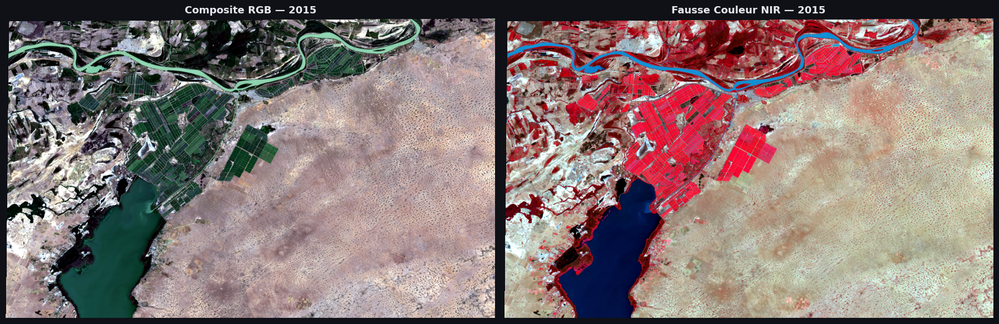

   💾 Sauvegardé : 01_Composites_RGB_2015.png


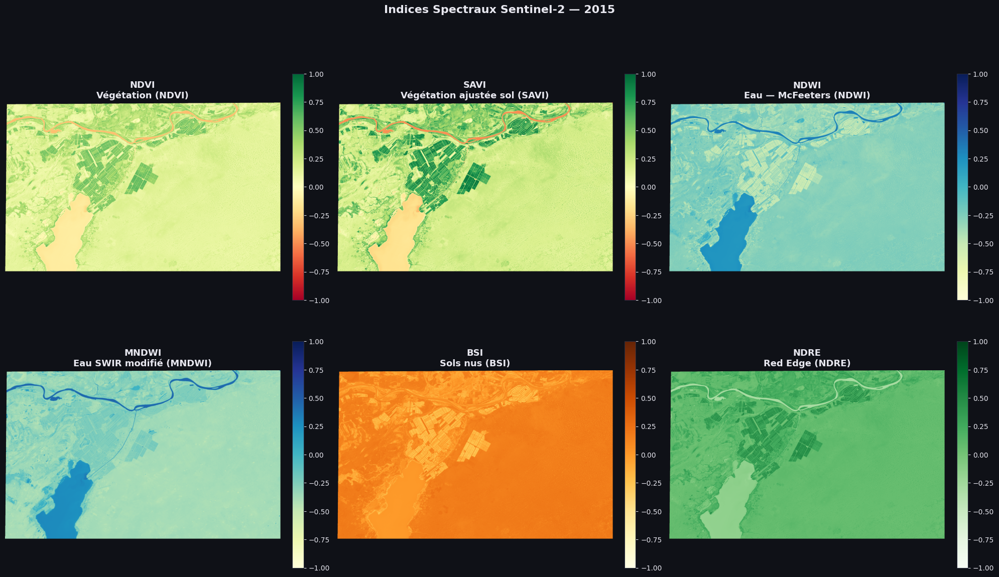

   💾 Sauvegardé : 02_Indices_Spectraux_2015.png


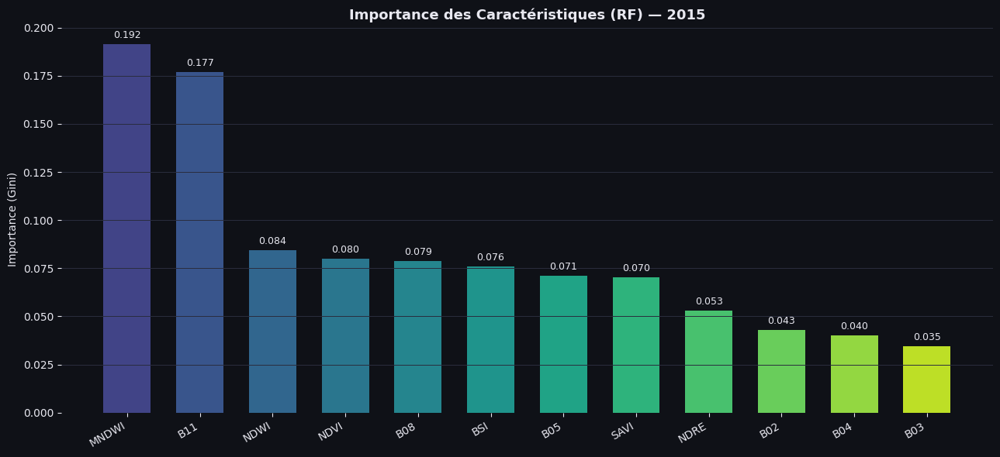

   💾 Sauvegardé : 03_Feature_Importance_2015.png


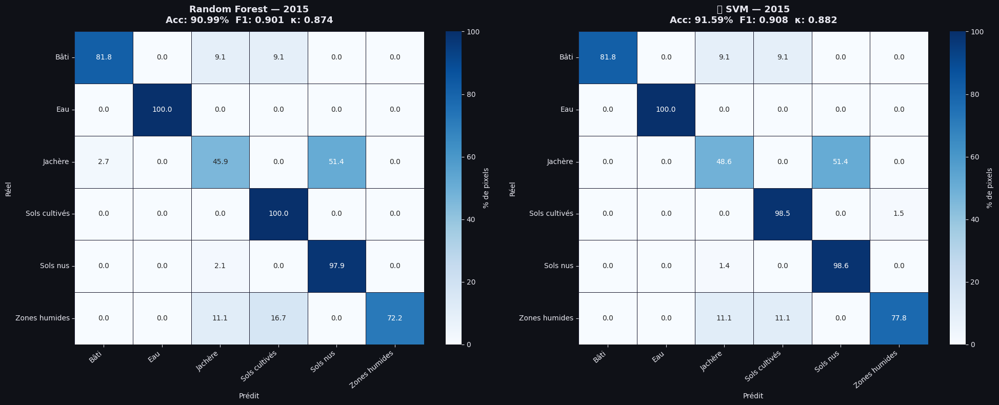

   💾 Sauvegardé : 04_Matrices_Confusion_2015.png


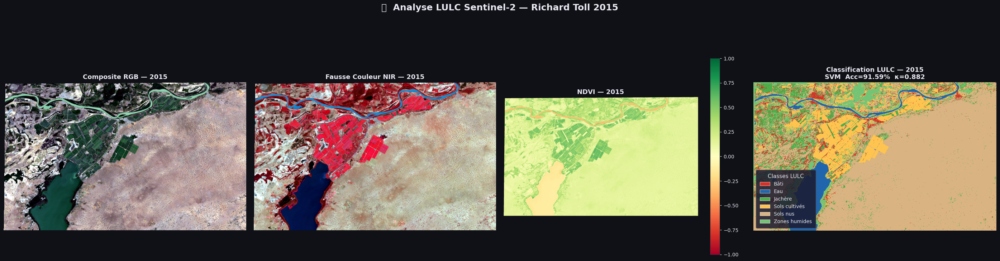

   💾 Sauvegardé : 05_Summary_LULC_2015.png


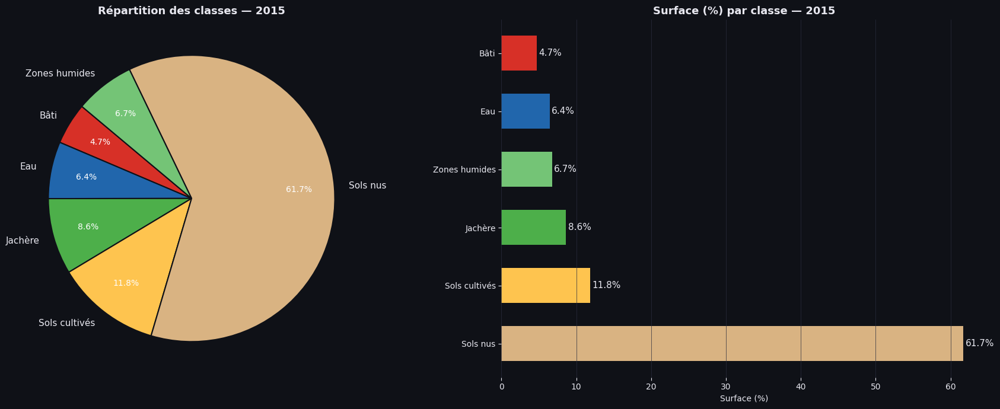

   💾 Sauvegardé : 06_Statistiques_Classes_2015.png

📋 RAPPORT FINAL — CLASSIFICATION LULC 2015
  🛰️  Image       : S2_2015_RichardToll_10bandes.tif
  📂 Shapefile   : DB_2015.shp
  🔬 Features    : 12 → ['B02', 'B03', 'B04', 'B05', 'B08', 'B11', 'NDVI', 'SAVI', 'NDWI', 'MNDWI', 'BSI', 'NDRE']

  📊 Performances :
    Random Forest
      Accuracy : 0.9099 (90.99%)
      F1 score : 0.9013
      Kappa    : 0.8741
    SVM 🏆
      Accuracy : 0.9159 (91.59%)
      F1 score : 0.9084
      Kappa    : 0.8824

  🗺️  Distribution des classes classifiées :
    Bâti                :    210,125 px  (  4.7%)
    Eau                 :    287,219 px  (  6.4%)
    Jachère             :    384,143 px  (  8.5%)
    Sols cultivés       :    528,098 px  ( 11.7%)
    Sols nus            :  2,756,814 px  ( 61.1%)
    Zones humides       :    301,410 px  (  6.7%)

  📁 Fichiers dans /media/cardan/87E3-1616/Projet_SIG/sortie_2015:
    • BSI_2015.tif
    • BSI_2025.tif
    • MNDWI_2015.tif
    • MNDWI_2025.tif
    •

In [9]:
# ╔══════════════════════════════════════════════════════════╗
# ║         9. LANCEMENT — CHOISIR L'ANNÉE ICI              ║
# ╚══════════════════════════════════════════════════════════╝

# ──────────────────────────────────────────────────────────
# PARAMÈTRES À AJUSTER :
#   YEAR         : 2015  ou  2025
#   OPTIMIZE     : True (GridSearchCV, plus long ~5-10 min)
#                  False (paramètres fixes, rapide ~1-2 min)
# ──────────────────────────────────────────────────────────

YEAR     = 2015      # ← changer ici : 2015 ou 2025
OPTIMIZE = True      # ← True = optimisation GridSearchCV

pipeline_2015 = LULCPipeline(CFG, year=YEAR, optimize_models=OPTIMIZE)
pipeline_2015.run()


★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
  PIPELINE LULC — ANNÉE 2025
★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
🛰️  Chargement : S2_2025_RichardToll_10bandes.tif
   CRS : EPSG:32628  |  Taille : 2713×1663  |  Bandes : 10
   ✓ 6 bandes chargées : ['B02', 'B03', 'B04', 'B05', 'B08', 'B11']
🧮 Calcul des indices spectraux...
   ✓ 6 indices calculés : ['NDVI', 'SAVI', 'NDWI', 'MNDWI', 'BSI', 'NDRE']
   ✓ 6 indices sauvegardés dans /media/cardan/87E3-1616/Projet_SIG/sortie_2025
📂 Chargement shapefile : DB_2025.shp
   Points totaux : 879
   Classes : ['Bâti', 'Eau', 'Jachère', 'Sols cultivés', 'Sols nus', 'Zones humides']
   Distribution :
     Sols nus: 466 pts (53.0%)
     Eau: 198 pts (22.5%)
     Sols cultivés: 117 pts (13.3%)
     Bâti: 36 pts (4.1%)
     Jachère: 36 pts (4.1%)
     Zones humides: 26 pts (3.0%)
   ✓ 879 échantillons extraits (0 ignorés — hors image ou NoData)
✓ Données préparées — Train: 615 | Test: 264

🚀 ENTRAÎNEMENT DES MODÈLES


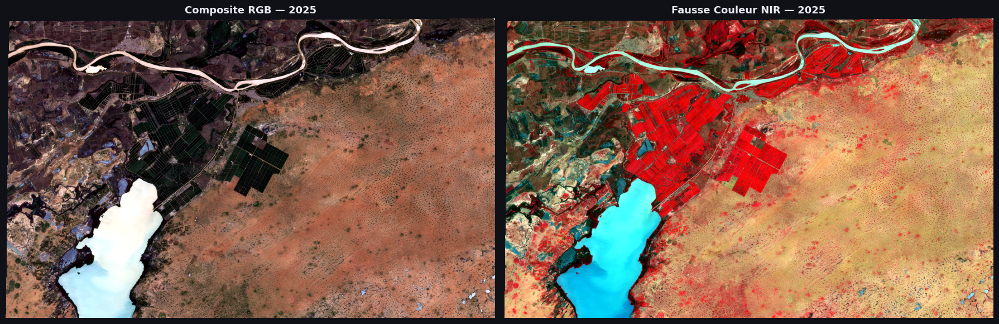

   💾 Sauvegardé : 01_Composites_RGB_2025.png


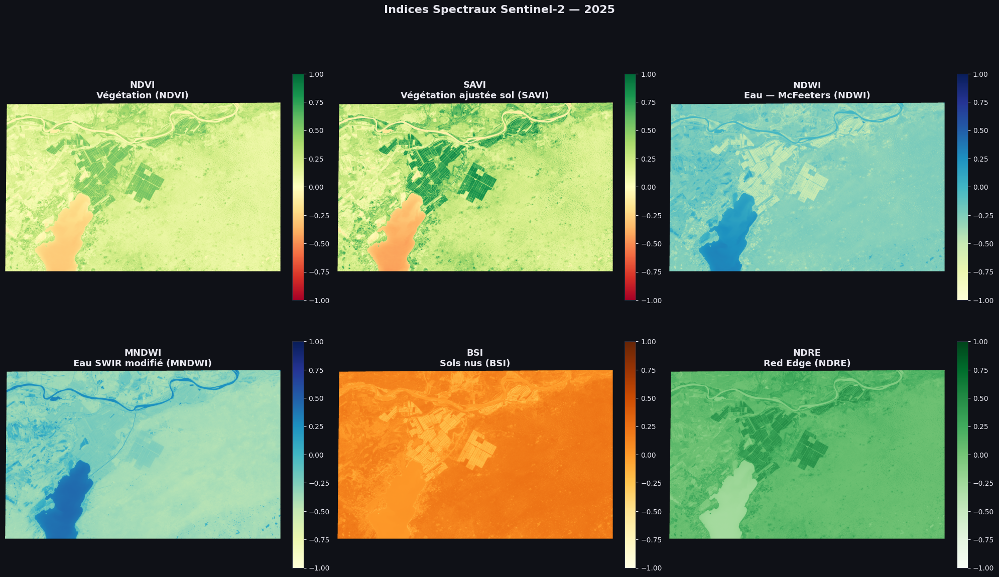

   💾 Sauvegardé : 02_Indices_Spectraux_2025.png


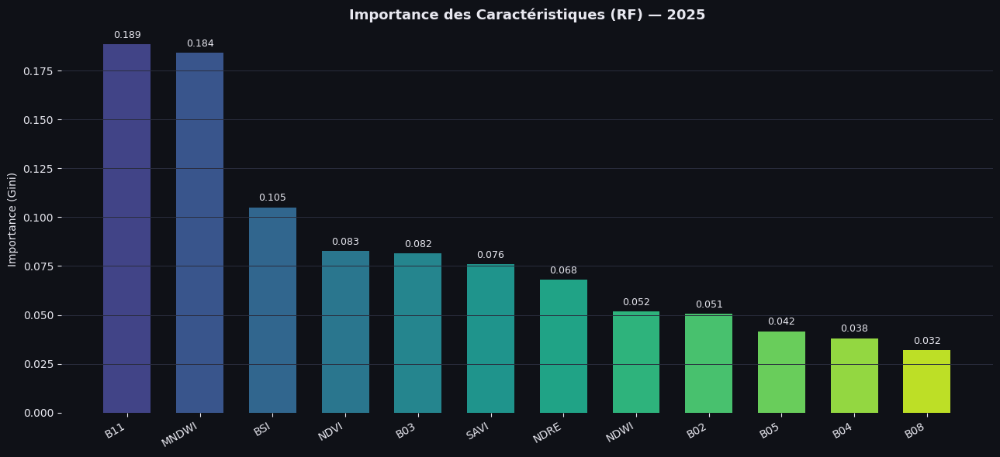

   💾 Sauvegardé : 03_Feature_Importance_2025.png


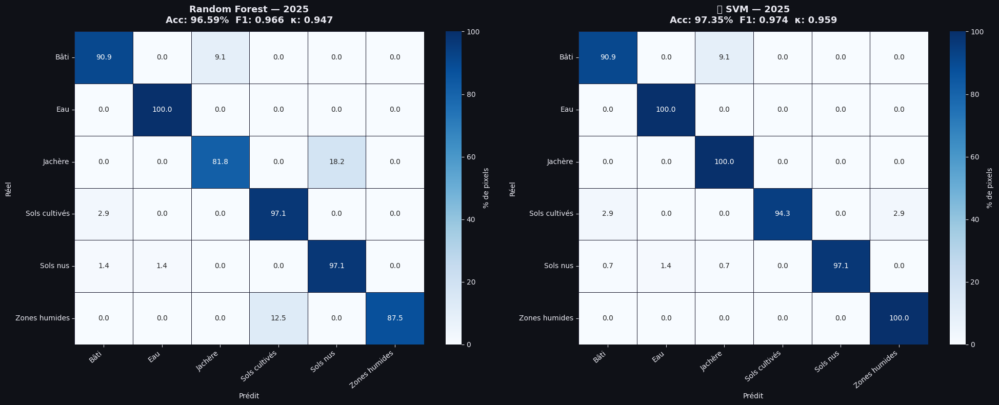

   💾 Sauvegardé : 04_Matrices_Confusion_2025.png


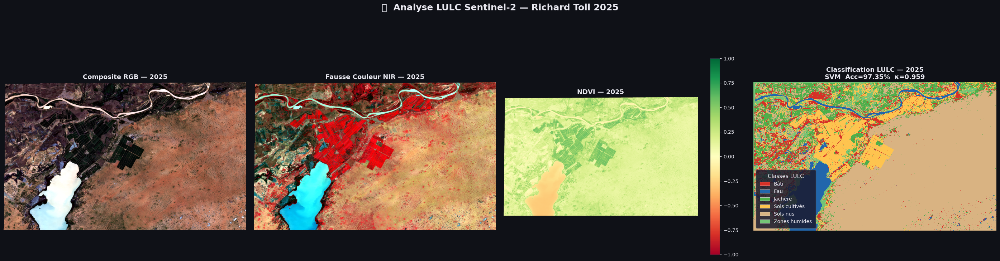

   💾 Sauvegardé : 05_Summary_LULC_2025.png


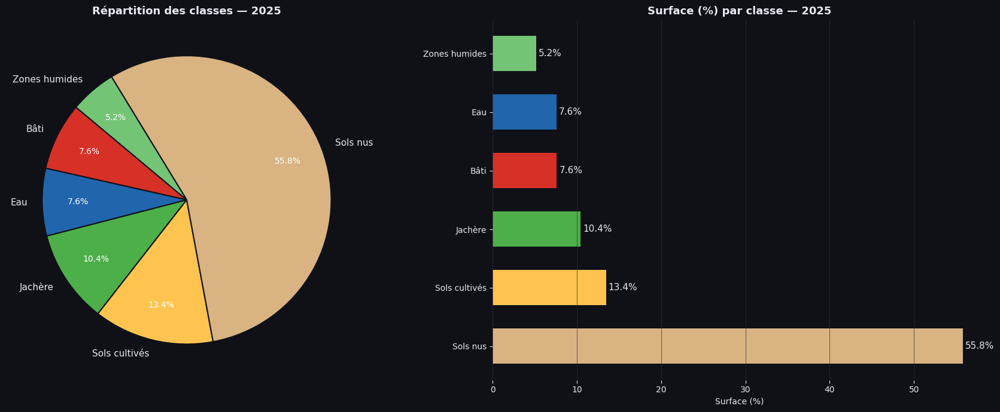

   💾 Sauvegardé : 06_Statistiques_Classes_2025.png

📋 RAPPORT FINAL — CLASSIFICATION LULC 2025
  🛰️  Image       : S2_2025_RichardToll_10bandes.tif
  📂 Shapefile   : DB_2025.shp
  🔬 Features    : 12 → ['B02', 'B03', 'B04', 'B05', 'B08', 'B11', 'NDVI', 'SAVI', 'NDWI', 'MNDWI', 'BSI', 'NDRE']

  📊 Performances :
    Random Forest
      Accuracy : 0.9659 (96.59%)
      F1 score : 0.9661
      Kappa    : 0.9475
    SVM 🏆
      Accuracy : 0.9735 (97.35%)
      F1 score : 0.9740
      Kappa    : 0.9594

  🗺️  Distribution des classes classifiées :
    Bâti                :    339,117 px  (  7.5%)
    Eau                 :    337,535 px  (  7.5%)
    Jachère             :    466,646 px  ( 10.3%)
    Sols cultivés       :    600,836 px  ( 13.3%)
    Sols nus            :  2,492,417 px  ( 55.2%)
    Zones humides       :    231,260 px  (  5.1%)

  📁 Fichiers dans /media/cardan/87E3-1616/Projet_SIG/sortie_2025:
    • BSI_2025.tif
    • MNDWI_2025.tif
    • NDRE_2025.tif
    • NDVI_2025.tif
    •

In [10]:
# ╔══════════════════════════════════════════════════════════╗
# ║     10. LANCEMENT POUR LA SECONDE ANNÉE (2025)          ║
# ╚══════════════════════════════════════════════════════════╝
# Décommentez pour lancer les deux années à la suite

pipeline_2025 = LULCPipeline(CFG, year=2025, optimize_models=OPTIMIZE)
pipeline_2025.run()

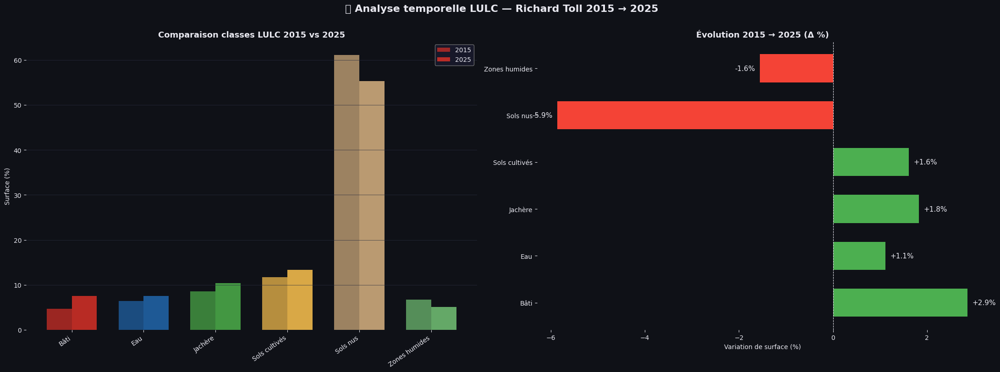

✓ Figure de comparaison inter-annuelle sauvegardée


In [11]:
# ╔══════════════════════════════════════════════════════════╗
# ║   11. COMPARAISON INTER-ANNUELLE (OPTIONNEL)            ║
# ╚══════════════════════════════════════════════════════════╝
# Exécutez ce bloc seulement si les deux pipelines ont été lancés.

def compare_years(p1: LULCPipeline, p2: LULCPipeline, cfg: LULCConfig) -> None:
    """Compare la répartition des classes entre deux années."""
    BG, TXT = "#0F1117", "#E8E8F0"
    
    fig, axes = plt.subplots(1, 2, figsize=(22, 8), facecolor=BG)
    
    data, years = [], [p1.year, p2.year]
    for pipeline in [p1, p2]:
        h, w = pipeline.class_map.shape
        row = {}
        for i, cls in enumerate(cfg.LULC_CLASSES):
            row[cls] = np.sum(pipeline.class_map == i) / (h * w) * 100
        data.append(row)
    
    df = pd.DataFrame(data, index=years)
    
    # ─ Barres groupées ──
    x = np.arange(len(cfg.LULC_CLASSES))
    width = 0.35
    colors = [cfg.LULC_COLORS[c] for c in cfg.LULC_CLASSES]
    
    for i, (yr, row) in enumerate(df.iterrows()):
        offset = (i - 0.5) * width
        bars = axes[0].bar(
            x + offset, row.values, width,
            label=str(yr), color=colors,
            alpha=0.7 + i * 0.15, edgecolor="none"
        )
    
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(cfg.LULC_CLASSES, rotation=35, ha="right", color=TXT)
    axes[0].set_ylabel("Surface (%)", color=TXT)
    axes[0].set_title("Comparaison classes LULC 2015 vs 2025", color=TXT)
    axes[0].legend([str(y) for y in years], facecolor="#1a1a2e",
                   labelcolor=TXT, edgecolor="gray")
    axes[0].set_facecolor(BG)
    axes[0].grid(axis="y", color="#2A2D3E", linewidth=0.5)
    axes[0].spines[:].set_visible(False)
    axes[0].tick_params(colors=TXT)
    
    # ─ Delta (évolution) ──
    delta = df.loc[years[1]] - df.loc[years[0]]
    bar_colors = ["#4CAF50" if v > 0 else "#F44336" for v in delta.values]
    bars = axes[1].barh(delta.index, delta.values, color=bar_colors,
                        edgecolor="none", height=0.6)
    for bar, val in zip(bars, delta.values):
        axes[1].text(
            val + (0.1 if val >= 0 else -0.1), bar.get_y() + bar.get_height()/2,
            f"{val:+.1f}%", va="center",
            ha="left" if val >= 0 else "right",
            color=TXT, fontsize=11
        )
    axes[1].axvline(0, color=TXT, linewidth=0.8, linestyle="--")
    axes[1].set_title(f"Évolution 2015 → 2025 (Δ %)", color=TXT)
    axes[1].set_xlabel("Variation de surface (%)", color=TXT)
    axes[1].set_facecolor(BG)
    axes[1].spines[:].set_visible(False)
    axes[1].tick_params(colors=TXT)
    
    plt.suptitle("🛰️ Analyse temporelle LULC — Richard Toll 2015 → 2025",
                 color=TXT, fontsize=16, fontweight="bold", y=1.01)
    plt.tight_layout()
    
    # Sauvegarder dans les deux dossiers
    for out in [p1.out_dir, p2.out_dir]:
        plt.savefig(str(out / "07_Comparaison_2015_2025.png"),
                    dpi=150, bbox_inches="tight", facecolor=BG)
    plt.show()
    print("✓ Figure de comparaison inter-annuelle sauvegardée")


# Pour utiliser :
compare_years(pipeline_2015, pipeline_2025, CFG)

📂 Chargement...
  ✓ 2015 chargé — résolution 20 m
  ✓ 2025 chargé — résolution 20 m

🗺️  Construction de la carte...


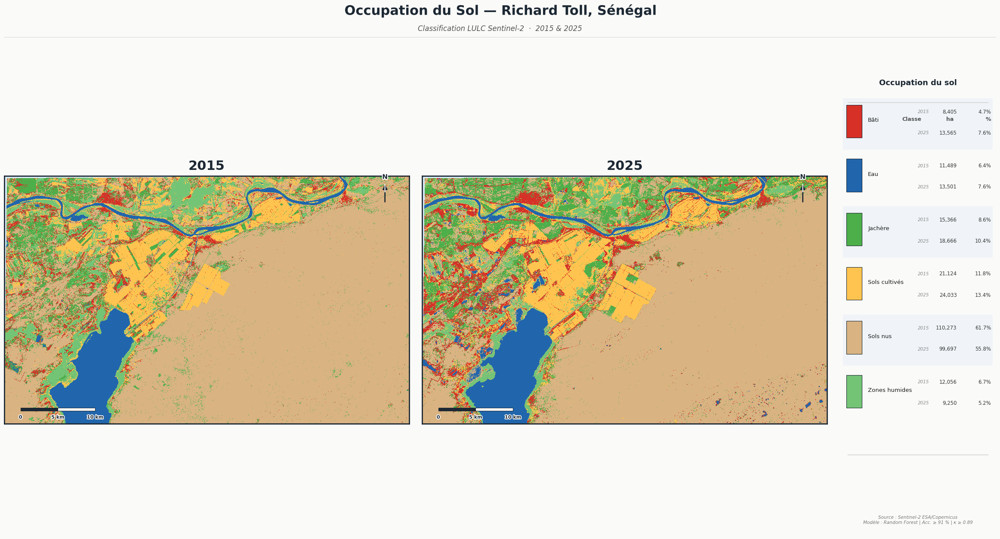


✅ Carte exportée :
   PNG 300 dpi → /media/cardan/87E3-1616/Projet_SIG/comparaison_2015_2025/CARTE_LULC_2015_2025.png
   PDF         → /media/cardan/87E3-1616/Projet_SIG/comparaison_2015_2025/CARTE_LULC_2015_2025.pdf


In [16]:
"""
CARTE LULC — Richard Toll 2015 & 2025
Épurée : 2 cartes | légende | flèche nord | échelle | style propre
"""

import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as pe
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

# ══════════════════════════════════════════════════════════════════════
# CONFIGURATION
# ══════════════════════════════════════════════════════════════════════
BASE_DIR = Path("/media/cardan/87E3-1616/Projet_SIG")
OUT_DIR  = BASE_DIR / "comparaison_2015_2025"
OUT_DIR.mkdir(parents=True, exist_ok=True)

PATHS = {
    2015: {
        "class": BASE_DIR / "sortie_2015/classification_2015.tif",
    },
    2025: {
        "class": BASE_DIR / "sortie_2025/classification_2025.tif",
    },
}

# ── Palette LULC ──────────────────────────────────────────────────────
LULC_COLORS = {
    "Bâti":          "#D73027",
    "Eau":           "#2166AC",
    "Jachère":       "#4DAF4A",
    "Sols cultivés": "#FEC44F",
    "Sols nus":      "#D9B382",
    "Zones humides": "#74C476",
}
LULC_CLASSES = sorted(LULC_COLORS.keys())
N_CLS        = len(LULC_CLASSES)
LULC_CMAP    = ListedColormap([LULC_COLORS[c] for c in LULC_CLASSES])
LULC_NORM    = BoundaryNorm(np.arange(-0.5, N_CLS), ncolors=N_CLS)

# ── Style visuel ──────────────────────────────────────────────────────
BG    = "#FAFAF8"     # fond blanc cassé
FRAME = "#1C2833"     # cadre sombre
WATER = "#D6EAF8"     # fond hors emprise (eau/extérieur)
TITLE_COLOR = "#1C2833"


# ══════════════════════════════════════════════════════════════════════
# CHARGEMENT
# ══════════════════════════════════════════════════════════════════════
def load_class(yr):
    with rasterio.open(PATHS[yr]["class"]) as src:
        cmap    = src.read(1).astype("float32")
        bounds  = src.bounds
        pixel_m = abs(src.transform.a)
        crs     = src.crs
    cmap[cmap == 255] = np.nan
    total = int(np.sum(~np.isnan(cmap)))
    stats = {}
    for i, cls in enumerate(LULC_CLASSES):
        cnt = int(np.nansum(cmap == i))
        stats[cls] = {
            "ha":  cnt * pixel_m**2 / 10_000,
            "pct": cnt / total * 100 if total > 0 else 0
        }
    print(f"  ✓ {yr} chargé — résolution {pixel_m:.0f} m")
    return {"cmap": cmap, "bounds": bounds,
            "pixel_m": pixel_m, "crs": crs, "stats": stats}

print("📂 Chargement...")
DATA = {yr: load_class(yr) for yr in [2015, 2025]}


# ══════════════════════════════════════════════════════════════════════
# FONCTIONS CARTOGRAPHIQUES ÉPURÉES
# ══════════════════════════════════════════════════════════════════════

def draw_map(ax, data, year):
    """Affiche la carte classifiée, cadre, fond eau."""
    b = data["bounds"]
    ax.set_facecolor(WATER)
    ax.imshow(
        data["cmap"],
        cmap=LULC_CMAP, norm=LULC_NORM,
        extent=[b.left, b.right, b.bottom, b.top],
        origin="upper", interpolation="nearest",
        aspect="equal", zorder=2
    )
    # Cadre épais
    for sp in ax.spines.values():
        sp.set_edgecolor(FRAME)
        sp.set_linewidth(2.0)
    # Supprimer les ticks
    ax.set_xticks([])
    ax.set_yticks([])
    # Titre de la carte
    ax.set_title(str(year), fontsize=22, fontweight="bold",
                 color=TITLE_COLOR, pad=10, loc="center")


def draw_north(ax, x=0.94, y=0.97, size=0.08):
    """Flèche Nord minimaliste."""
    # Tige
    ax.annotate(
        "", xy=(x, y), xytext=(x, y - size),
        xycoords="axes fraction", textcoords="axes fraction",
        arrowprops=dict(arrowstyle="-|>", color=FRAME,
                        lw=2.0, mutation_scale=16),
        zorder=20
    )
    # Demi-flèche blanche (effet bicolore)
    ax.annotate(
        "", xy=(x, y), xytext=(x, y - size / 2),
        xycoords="axes fraction", textcoords="axes fraction",
        arrowprops=dict(arrowstyle="-", color="white",
                        lw=1.5),
        zorder=21
    )
    # Lettre N
    ax.text(x, y + 0.012, "N",
            transform=ax.transAxes,
            ha="center", va="bottom",
            fontsize=11, fontweight="bold", color=FRAME,
            zorder=22,
            path_effects=[pe.withStroke(linewidth=3, foreground="white")])


def draw_scale(ax, pixel_m, bar_km=10, x=0.04, y=0.05):
    """Barre d'échelle sobre."""
    xlim    = ax.get_xlim()
    map_w   = xlim[1] - xlim[0]           # largeur de l'image en m
    frac    = (bar_km * 1000) / map_w     # fraction de l'axe
    seg     = frac / 2
    ybar    = y - 0.012

    # 2 segments alternés
    for i in range(2):
        ax.add_patch(Rectangle(
            (x + i * seg, ybar), seg, 0.012,
            transform=ax.transAxes,
            facecolor=FRAME if i % 2 == 0 else "white",
            edgecolor=FRAME, linewidth=0.8,
            clip_on=False, zorder=20
        ))
    # Labels
    for lbl, xp in [("0", x),
                     (f"{bar_km // 2} km", x + seg),
                     (f"{bar_km} km",       x + frac)]:
        ax.text(xp, ybar - 0.018, lbl,
                transform=ax.transAxes,
                ha="center", va="top",
                fontsize=8, color=FRAME, fontweight="bold",
                zorder=20,
                path_effects=[pe.withStroke(linewidth=2.5,
                                             foreground="white")])


def draw_legend(ax):
    """
    Légende verticale épurée :
    carré couleur + nom classe + superficie + %.
    Placée dans un axe dédié.
    """
    ax.set_facecolor(BG)
    ax.axis("off")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    # Titre légende
    ax.text(0.5, 0.97, "Occupation du sol",
            ha="center", va="top",
            fontsize=13, fontweight="bold", color=TITLE_COLOR)

    # Séparateur
    ax.plot([0.05, 0.95], [0.92, 0.92],
            color="#CCCCCC", lw=1.0, clip_on=False)

    # En-têtes colonnes
    ax.text(0.40, 0.89, "Classe",    ha="left",  va="top", fontsize=9,
            fontweight="bold", color="#555555")
    ax.text(0.73, 0.89, "ha",        ha="right", va="top", fontsize=9,
            fontweight="bold", color="#555555")
    ax.text(0.97, 0.89, "%",         ha="right", va="top", fontsize=9,
            fontweight="bold", color="#555555")

    row_h = 0.115
    for i, cls in enumerate(LULC_CLASSES):
        s15  = DATA[2015]["stats"][cls]
        s25  = DATA[2025]["stats"][cls]
        yi   = 0.84 - i * row_h

        # Fond alternant léger
        if i % 2 == 0:
            ax.add_patch(Rectangle(
                (0.02, yi - 0.02), 0.96, row_h * 0.95,
                facecolor="#F0F4F8", edgecolor="none", zorder=0))

        # Carré couleur
        ax.add_patch(Rectangle(
            (0.04, yi + 0.005), 0.10, 0.07,
            facecolor=LULC_COLORS[cls],
            edgecolor=FRAME, linewidth=0.8, zorder=2))

        # Nom classe
        ax.text(0.18, yi + 0.042, cls,
                ha="left", va="center",
                fontsize=9.5, color="#1A1A1A")

        # 2015 — valeurs
        ax.text(0.50, yi + 0.060, "2015",
                ha="left", va="center", fontsize=7.5,
                color="#888888", style="italic")
        ax.text(0.75, yi + 0.060, f"{s15['ha']:,.0f}",
                ha="right", va="center", fontsize=8.5, color="#333333")
        ax.text(0.97, yi + 0.060, f"{s15['pct']:.1f}%",
                ha="right", va="center", fontsize=8.5, color="#333333")

        # 2025 — valeurs
        ax.text(0.50, yi + 0.015, "2025",
                ha="left", va="center", fontsize=7.5,
                color="#888888", style="italic")
        ax.text(0.75, yi + 0.015, f"{s25['ha']:,.0f}",
                ha="right", va="center", fontsize=8.5, color="#333333")
        ax.text(0.97, yi + 0.015, f"{s25['pct']:.1f}%",
                ha="right", va="center", fontsize=8.5, color="#333333")

    # Séparateur bas
    yi_bot = 0.84 - N_CLS * row_h
    ax.plot([0.05, 0.95], [yi_bot + 0.02, yi_bot + 0.02],
            color="#CCCCCC", lw=1.0, clip_on=False)

    # Source
    ax.text(0.5, 0.02,
            "Source : Sentinel-2 ESA/Copernicus\n"
            "Modèle : Random Forest | Acc. ≥ 91 % | κ ≥ 0.89",
            ha="center", va="bottom", fontsize=7.5,
            color="#777777", style="italic")


# ══════════════════════════════════════════════════════════════════════
# FIGURE
# ══════════════════════════════════════════════════════════════════════
print("\n🗺️  Construction de la carte...")

fig = plt.figure(figsize=(24, 13), facecolor=BG)

# Layout : [carte 2015] [carte 2025] [légende]
gs = gridspec.GridSpec(
    1, 3,
    width_ratios=[2.6, 2.6, 1],
    wspace=0.04,
    left=0.02, right=0.98,
    top=0.88, bottom=0.04
)

ax_15  = fig.add_subplot(gs[0])
ax_25  = fig.add_subplot(gs[1])
ax_leg = fig.add_subplot(gs[2])

# ── Cartes ────────────────────────────────────────────────────────────
draw_map(ax_15, DATA[2015], 2015)
draw_map(ax_25, DATA[2025], 2025)

# ── Éléments cartographiques (sur chaque carte) ───────────────────────
for ax, yr in [(ax_15, 2015), (ax_25, 2025)]:
    draw_north(ax, x=0.94, y=0.97, size=0.08)
    draw_scale(ax, DATA[yr]["pixel_m"], bar_km=10, x=0.04, y=0.065)

# ── Légende ───────────────────────────────────────────────────────────
draw_legend(ax_leg)

# ── Titre principal ───────────────────────────────────────────────────
fig.text(
    0.50, 0.965,
    "Occupation du Sol — Richard Toll, Sénégal",
    ha="center", va="bottom",
    fontsize=22, fontweight="bold", color=TITLE_COLOR,
    path_effects=[pe.withStroke(linewidth=5, foreground=BG)]
)
fig.text(
    0.50, 0.938,
    "Classification LULC Sentinel-2  ·  2015 & 2025",
    ha="center", va="bottom",
    fontsize=12, color="#555555", style="italic"
)

# ── Ligne de titre ────────────────────────────────────────────────────
fig.add_artist(plt.Line2D(
    [0.02, 0.98], [0.930, 0.930],
    transform=fig.transFigure,
    color="#DDDDDD", linewidth=1.0
))

# ══════════════════════════════════════════════════════════════════════
# EXPORT
# ══════════════════════════════════════════════════════════════════════
out_png = OUT_DIR / "CARTE_LULC_2015_2025.png"
out_pdf = OUT_DIR / "CARTE_LULC_2015_2025.pdf"

plt.savefig(str(out_png), dpi=300, bbox_inches="tight",
            facecolor=BG, edgecolor="none")
plt.savefig(str(out_pdf), bbox_inches="tight",
            facecolor=BG, edgecolor="none")
plt.show()

print(f"\n✅ Carte exportée :")
print(f"   PNG 300 dpi → {out_png}")
print(f"   PDF         → {out_pdf}")